## Tarea 2

### Problema 1

Importar librerias para graficar:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = True

Se define la función $f(x,y)$ y se grafica su superficie

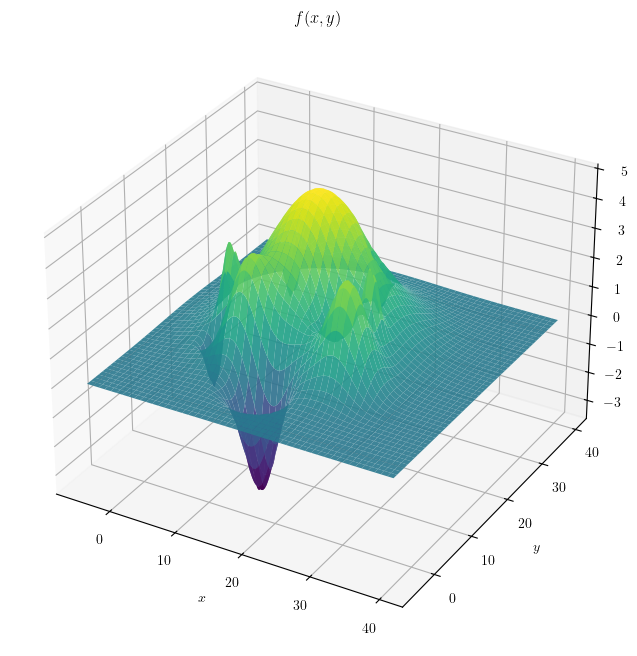

In [2]:
from mpl_toolkits.mplot3d import Axes3D

x1 = np.linspace(-5, 40, 2000)
x2 = np.linspace(-5, 40, 2000)
X1, X2 = np.meshgrid(x1, x2)

def f(x,y):
    f1 = 5*np.exp(-0.01*((x-15)**2 + (y-20)**2)) - 2*np.exp(-0.08*((x-20)**2 + (y-15)**2))
    f2 = 3*np.exp(-0.08*((x-25)**2 + (y-10)**2)) + 2*np.exp(-0.1*((x-10)**2 + (y-10)**2))
    f3 = -2*np.exp(-0.5*((x-5)**2 + (y-10)**2)) - 4*np.exp(-0.1*((x-15)**2 + (y-5)**2))
    f4 = -2*np.exp(-0.5*((x-8)**2 + (y-25)**2)) - 2*np.exp(-0.5*((x-21)**2 + (y-25)**2))
    f5 = 2*np.exp(-0.5*((x-25)**2 + (y-16)**2)) + 2*np.exp(-0.5*((x-5)**2 + (y-14)**2))
    return f1 + f2 + f3 + f4 + f5

F = f(X1,X2)

fig = plt.figure(figsize=(8,8))
ax=fig.add_subplot(projection='3d')
ax.plot_surface(X1, X2, F, cmap='viridis',alpha=0.9)
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')

plt.title(r'$f(x,y)$')
plt.grid(visible=True)
plt.savefig('plot_p1_1.pdf',dpi=500,bbox_inches='tight')
plt.show()




Se grafica el mapa de contorno de la función $f(x,y)$:

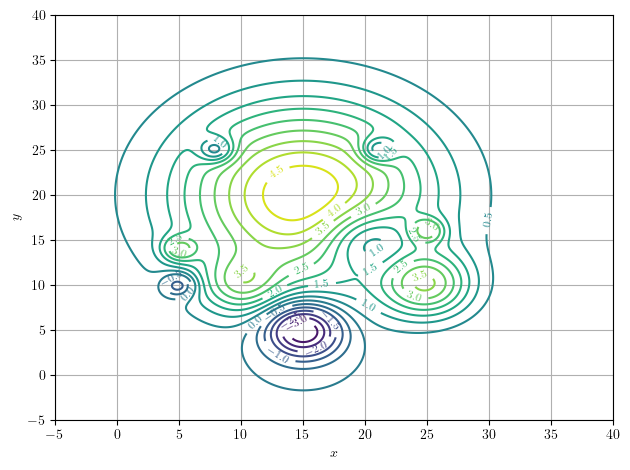

In [3]:
fig, ax = plt.subplots()
CS= ax.contour(X1,X2,F,levels=20,cmap='viridis')
ax.clabel(CS,inline=True,fontsize=8)
plt.xlabel('$x$')
plt.ylabel('$y$')
plt.grid(visible=True)
plt.savefig('plot_p1_2.pdf',dpi=500,bbox_inches='tight')
plt.tight_layout()
plt.show()

Sobre el mapa de contorno se identifican los puntos sobre los que puede estar el máximo de $f(x,y)$:

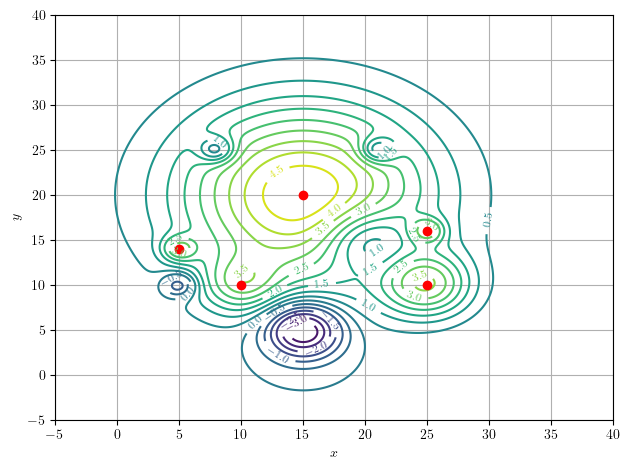

In [4]:
fig, ax = plt.subplots()
CS= ax.contour(X1,X2,F,levels=20,cmap='viridis')
plt.plot([5,10,15,25,25],[14,10,20,10,16],marker='o',linestyle='',color='red')
ax.clabel(CS,inline=True,fontsize=8)
plt.xlabel('$x$')
plt.ylabel('$y$')
plt.grid(visible=True)
plt.savefig('plot_p1_3.pdf',dpi=500,bbox_inches='tight')
plt.tight_layout()
plt.show()

### Problema 2

Se define el modelo del robot:

In [2]:
import mpc
import numpy as np
import casadi as cas

# =====================================
# DEFINE THE MODEL
# =====================================

model_uni = mpc.model("continuous")

# States
x = model_uni.set_state("x")
y = model_uni.set_state("y")
theta = model_uni.set_state("theta")

# Inputs
v = model_uni.set_input("v")
omega = model_uni.set_input("omega")

# Define dynamics
model_uni.set_rhs("x", v * cas.cos(theta))
model_uni.set_rhs("y", v * cas.sin(theta))
model_uni.set_rhs("theta", omega)

# Build symbolic model
model_uni.setup()

# Create discrete version using RK4
dt = 0.2
model_uni.create_discretization(dt)

print("Model successfully created.")

Model successfully created.


#### Punto 2a - Caso 1

In [37]:
controller = mpc.MPC_Controller(model_uni)

# Horizon and sampling
N = 10
controller.set_params(N=N, dt=dt)

# Weight matrices
Q = np.diag([200, 200, 50])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort


controller.set_obj_function_params(Q, R)

# Input constraints
controller.set_input_bounds(
    lb=np.array([-0.6, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# State bounds
controller.set_state_bounds(
    lb=np.array([-2,-2,-10]),
    ub=np.array([2,2,10])
)

controller.set_reference_mode("constant")

controller.setup_controller()

print("MPC successfully built.")

MPC successfully built.


In [38]:
x_ref = np.array([1.5, 1.5, 0])

sim = mpc.MPC_Simulator(model_uni)

x0 = np.array([0, 0, 0])

x_hist, u_hist, t_hist = sim.run_closed_loop(
    controller=controller,
    x_0=x0,
    X_ref=x_ref,
    n_steps=60
)

print("Simulation complete.")


Simulation complete.


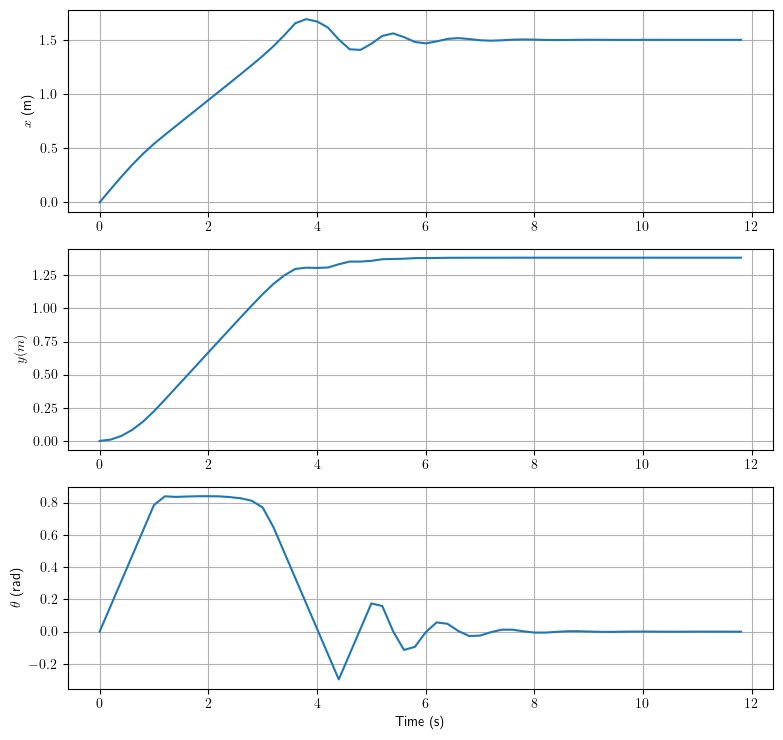

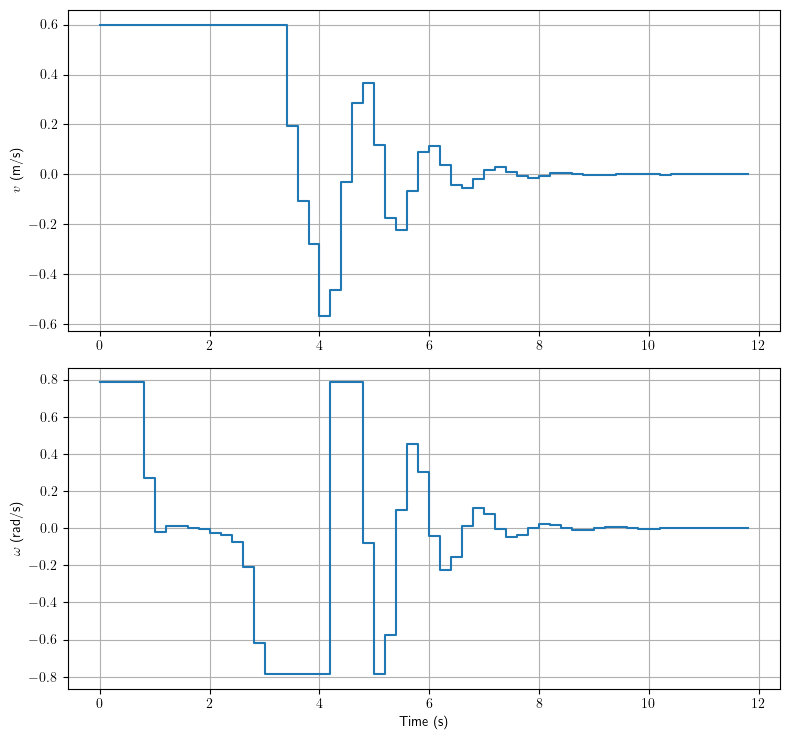

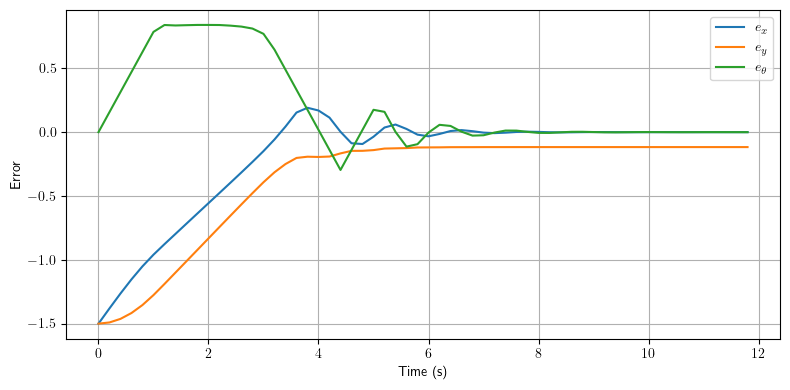

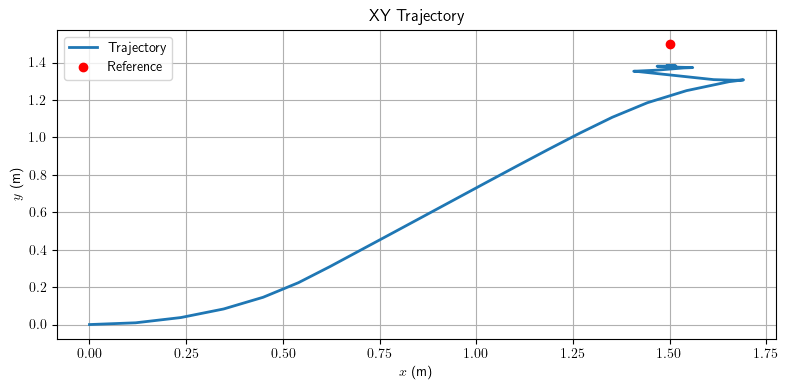

In [39]:
sim.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False
)



Gif save to simulation_p1a_1.gif


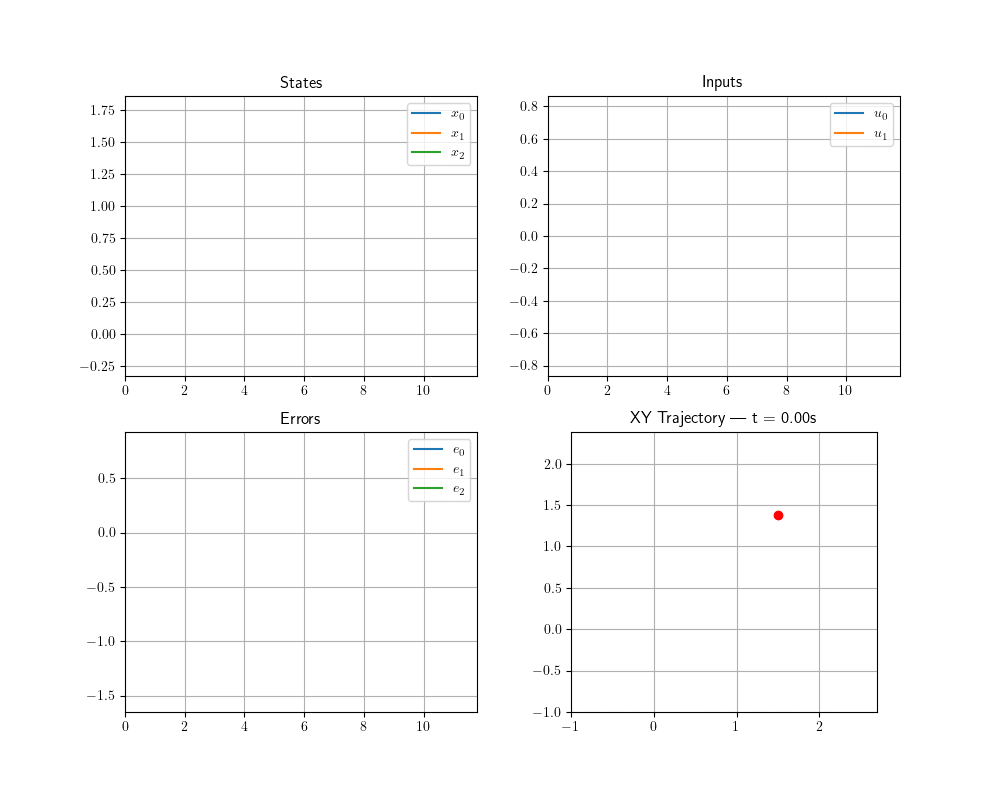

In [40]:
sim.animate_results(filename="simulation_p1a_1.gif",fps=20)

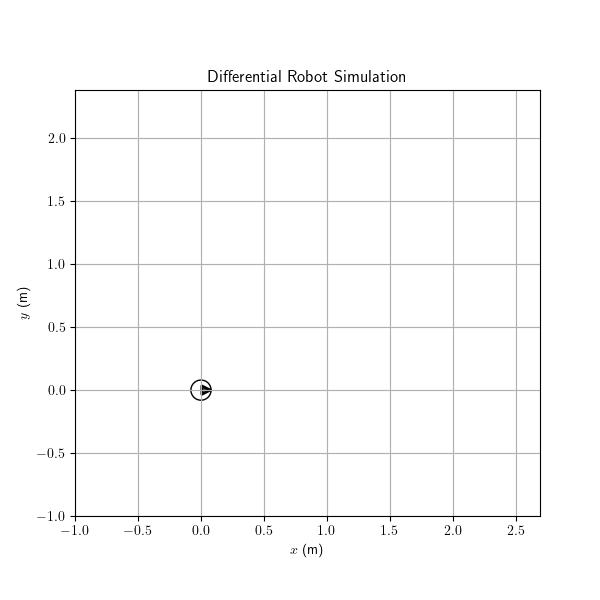

In [41]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Image, display
from matplotlib.patches import FancyArrowPatch
plt.rcParams['text.usetex'] = True

def animate_robot(x_history,controller, theta_index=2,
                     filename="unicycle.gif",
                     fps=20,
                     radius=0.08):
    """
    Animate robot in XY plane as circle with heading arrow.
    """

     
    X = x_history

    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_aspect("equal")
    ax.set_xlim(np.min(X[:,0])-1, np.max(X[:,0])+1)
    ax.set_ylim(np.min(X[:,1])-1, np.max(X[:,1])+1)
    ax.set_xlabel(r"$x$ (m)")
    ax.set_ylabel(r"$y$ (m)")
    ax.set_title("Differential Robot Simulation")
    ax.grid()

    for constraint in controller.constraints:
        if hasattr(constraint, "plot"):
            constraint.plot(ax)

    # Trajectory line
    traj_line, = ax.plot([], [], '--', alpha=0.5)

    # Robot body
    robot_body = plt.Circle((0,0), radius, fill=False)
    ax.add_patch(robot_body)

    # Heading arrow
    arrow = FancyArrowPatch((0,0), (0,0),
                            arrowstyle='-|>',
                            mutation_scale=15,
                            linewidth=2)
    ax.add_patch(arrow)

    def update(frame):

        x = X[frame,0]
        y = X[frame,1]
        theta = X[frame,theta_index]

        # Update trajectory
        traj_line.set_data(X[:frame,0], X[:frame,1])

        # Update robot body
        robot_body.center = (x,y)

        # Arrow tip
        arrow_length = 1.5 * radius
        hx = x + arrow_length * np.cos(theta)
        hy = y + arrow_length * np.sin(theta)

        # Update arrow position
        arrow.set_positions((x,y), (hx,hy))

        return traj_line, robot_body, arrow

    ani = animation.FuncAnimation(
        fig, update,
        frames=len(X),
        interval=1000/fps,
        blit=True
    )

    writer = animation.ImageMagickWriter(fps=fps)
    ani.save(filename, writer=writer)

    plt.close(fig)

animate_robot(sim.x_history, controller,filename="robot_1a_1.gif")
display(Image(filename="robot_1a_1.gif"))


#### Punto 2a - Caso 2

In [42]:
controller = mpc.MPC_Controller(model_uni)

# Horizon and sampling
N = 50
controller.set_params(N=N, dt=dt)

# Weight matrices
Q = np.diag([200, 200, 50])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort


controller.set_obj_function_params(Q, R)

# Input constraints
controller.set_input_bounds(
    lb=np.array([-0.6, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# State bounds
controller.set_state_bounds(
    lb=np.array([-2,-2,-10]),
    ub=np.array([2,2,10])
)

controller.set_reference_mode("constant")

controller.setup_controller()

print("MPC successfully built.")

x_ref = np.array([1.5, 1.5, 0])

sim = mpc.MPC_Simulator(model_uni)

x0 = np.array([0, 0, 0])

x_hist, u_hist, t_hist = sim.run_closed_loop(
    controller=controller,
    x_0=x0,
    X_ref=x_ref,
    n_steps=60
)

print("Simulation complete.")


MPC successfully built.
Simulation complete.


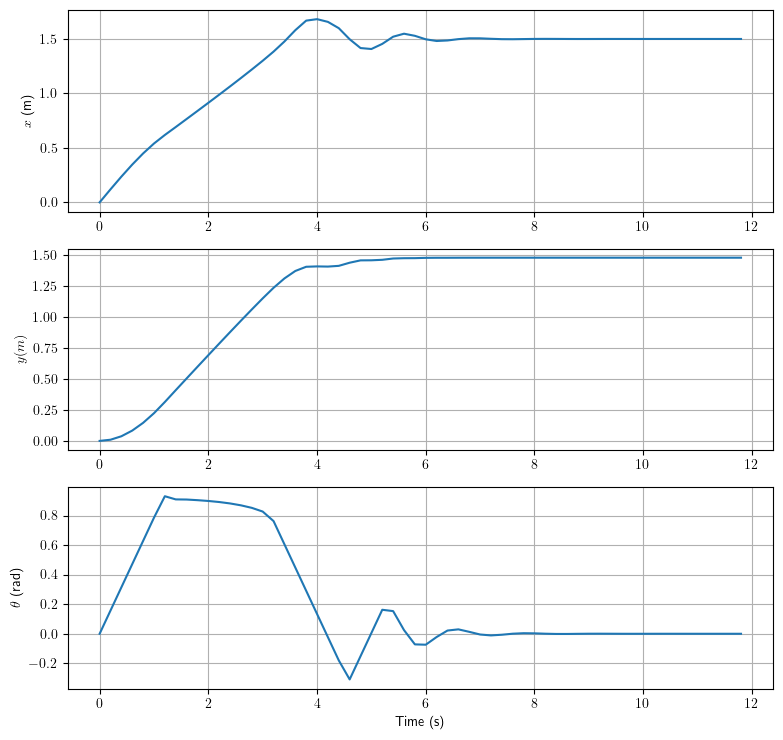

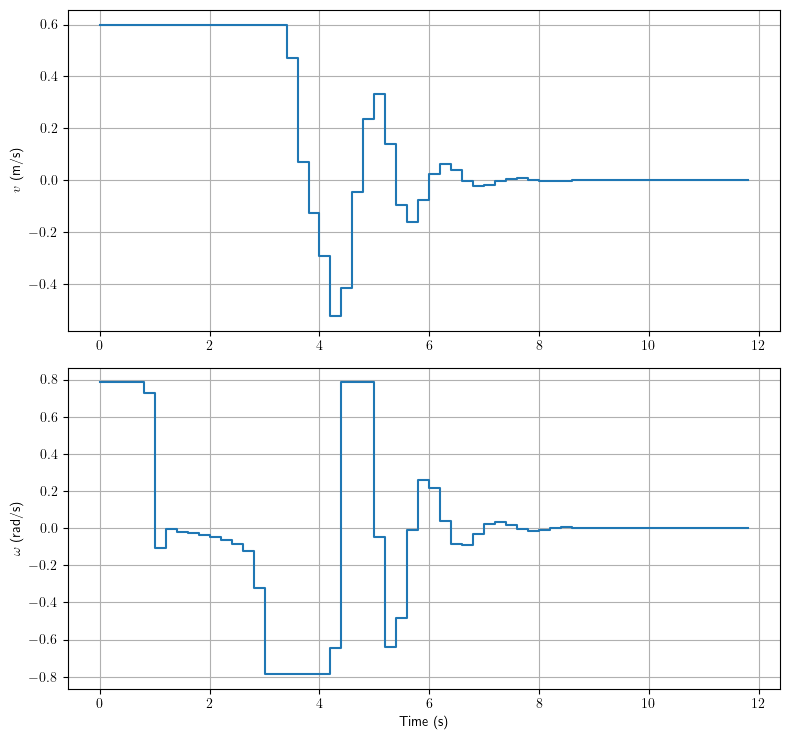

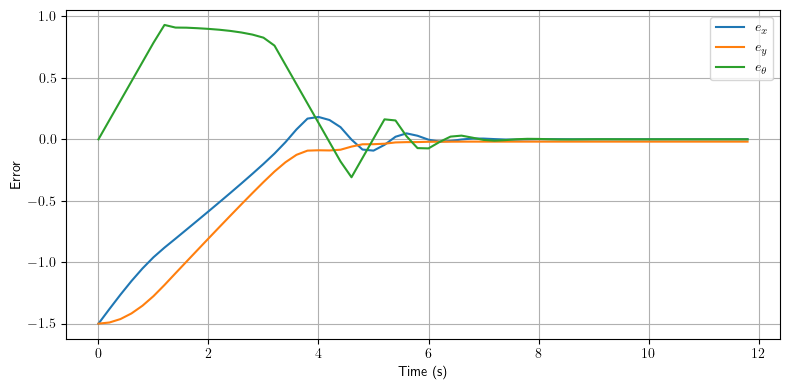

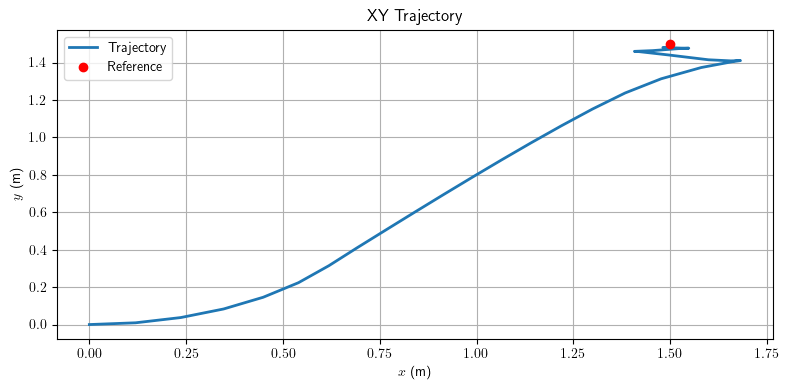

In [43]:
sim.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False
)


Gif save to simulation_p1a_2.gif


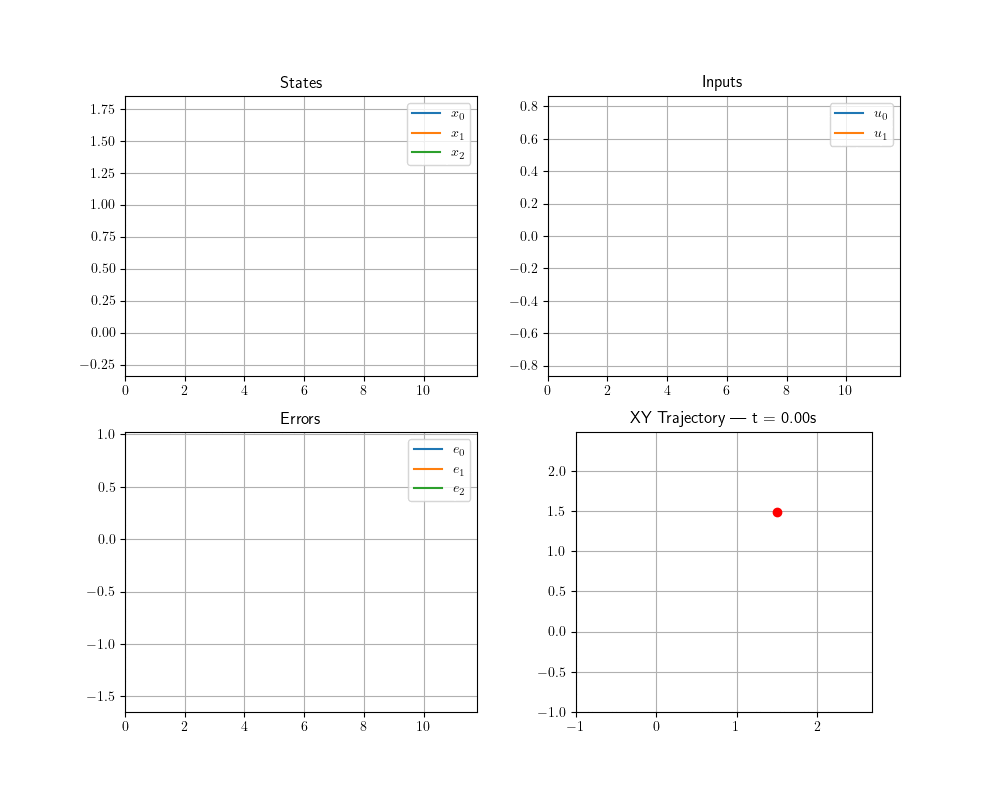

In [44]:
sim.animate_results(filename="simulation_p1a_2.gif",fps=20)

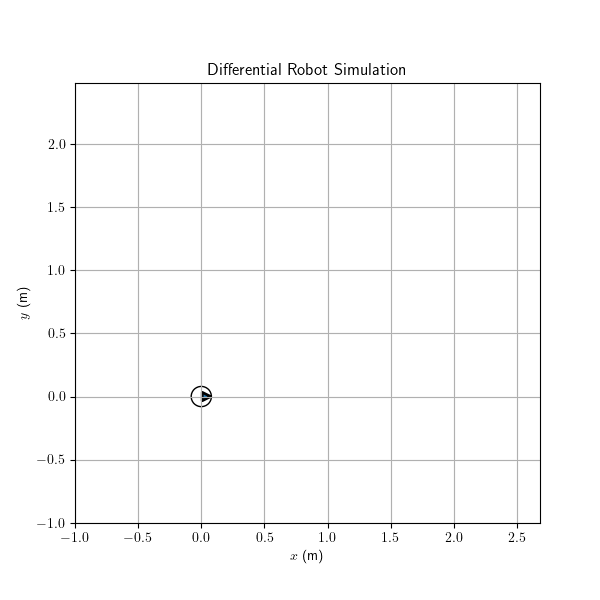

In [45]:
animate_robot(sim.x_history, controller,filename="robot_1a_2.gif")
display(Image(filename="robot_1a_2.gif"))

#### Punto 2a - Caso 3

In [46]:
controller = mpc.MPC_Controller(model_uni)

# Horizon and sampling
N = 25
controller.set_params(N=N, dt=dt)

# Weight matrices
Q = np.diag([200, 200, 50])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort
P = np.diag([8000, 8000, 800]) # Terminal cost


controller.set_obj_function_params(Q, R, P)

# Input constraints
controller.set_input_bounds(
    lb=np.array([-0.6, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# State bounds
controller.set_state_bounds(
    lb=np.array([-2,-2,-10]),
    ub=np.array([2,2,10])
)

controller.set_reference_mode("constant")

controller.setup_controller()

print("MPC successfully built.")

x_ref = np.array([1.5, 1.5, 0])

sim = mpc.MPC_Simulator(model_uni)

x0 = np.array([0, 0, 0])

x_hist, u_hist, t_hist = sim.run_closed_loop(
    controller=controller,
    x_0=x0,
    X_ref=x_ref,
    n_steps=60
)

print("Simulation complete.")


MPC successfully built.
Simulation complete.


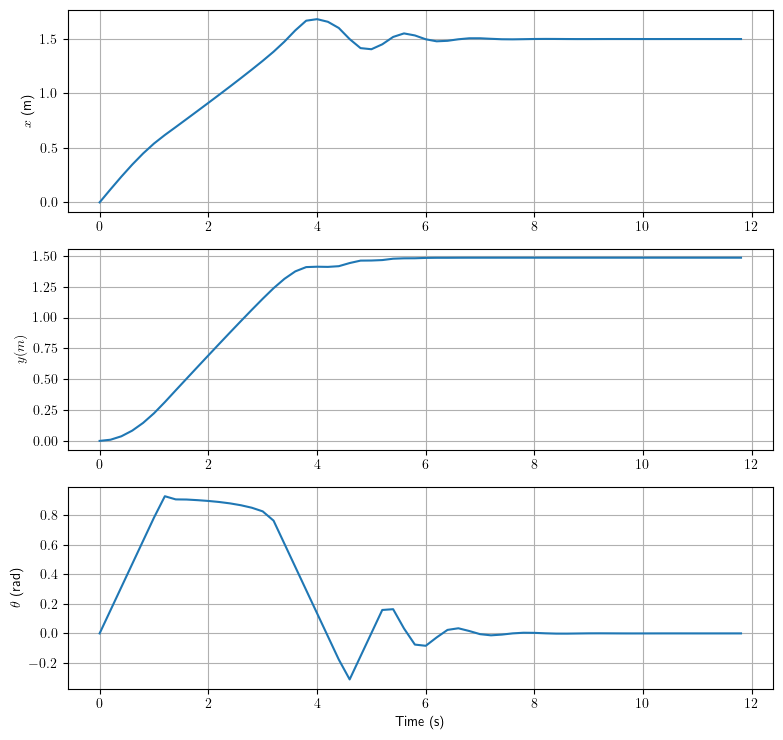

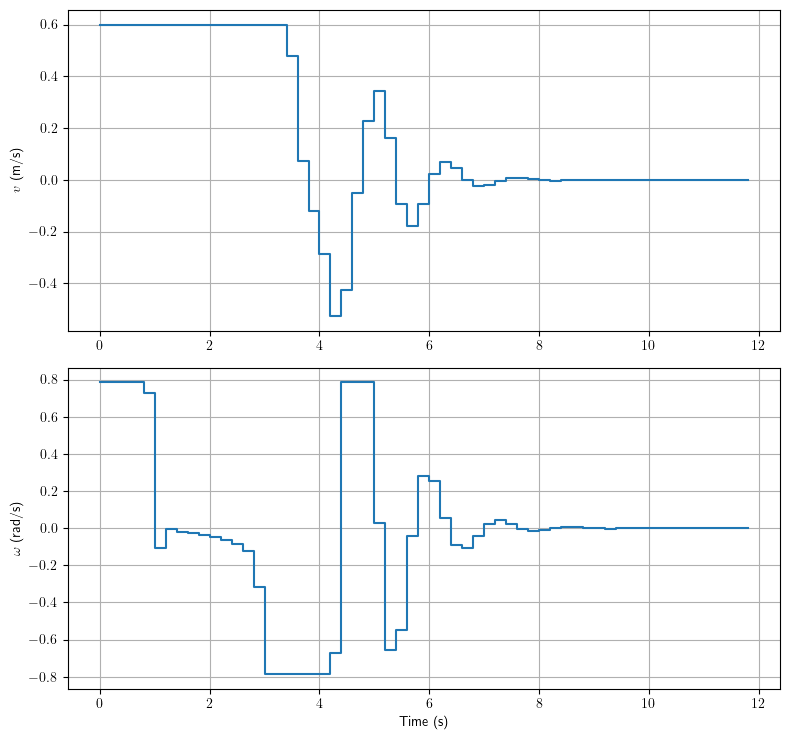

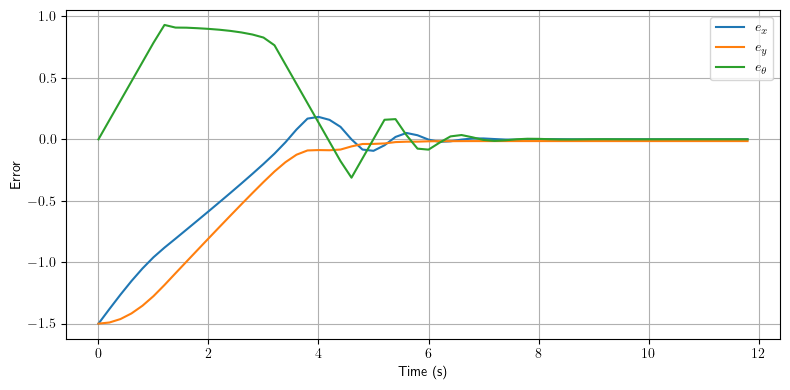

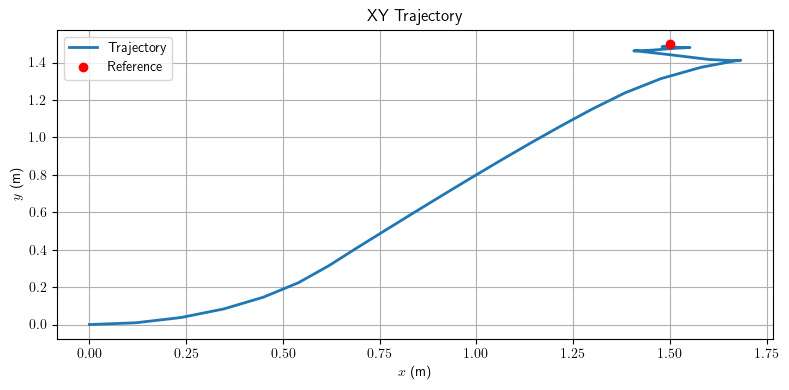

In [47]:
sim.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False
)


Gif save to simulation_p1a_3.gif


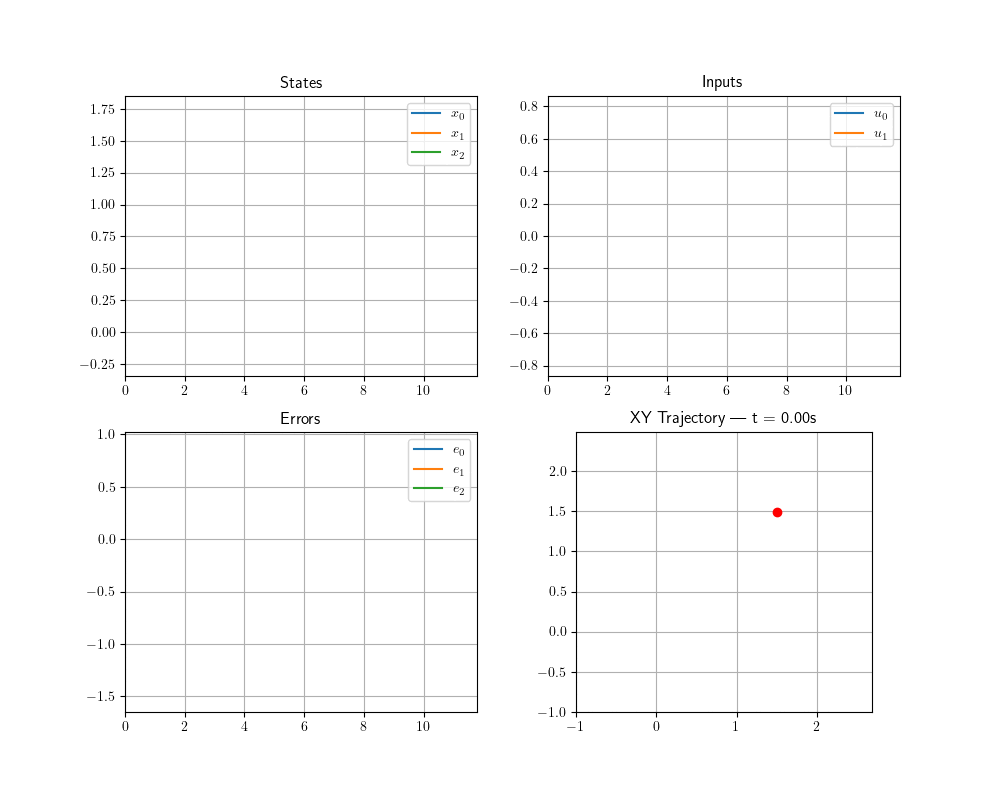

In [48]:
sim.animate_results(filename="simulation_p1a_3.gif",fps=20)

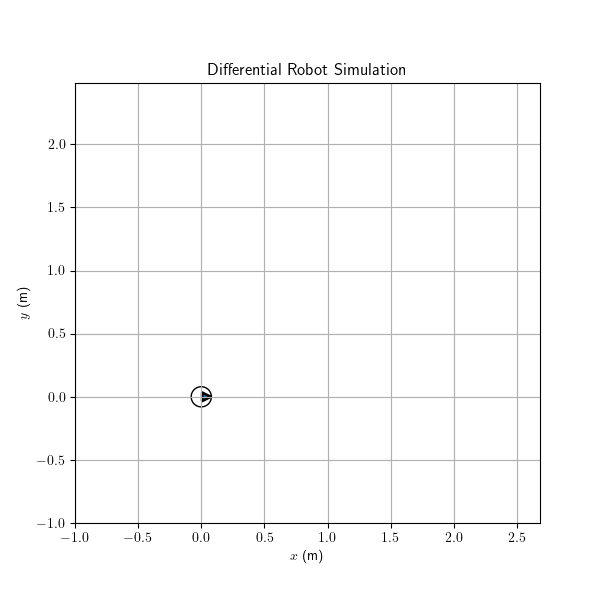

In [49]:
animate_robot(sim.x_history, controller,filename="robot_1a_3.gif")
display(Image(filename="robot_1a_3.gif"))

#### Punto 2b - Caso 1

In [50]:
controller = mpc.MPC_Controller(model_uni)

# Horizon and sampling
N = 25
controller.set_params(N=N, dt=dt)

# Weight matrices
Q = np.diag([200, 200, 50])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort
P = np.diag([8000, 8000, 800]) # Terminal cost


controller.set_obj_function_params(Q, R, P)

# Input constraints
controller.set_input_bounds(
    lb=np.array([-0.6, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# State bounds
controller.set_state_bounds(
    lb=np.array([-2,-2,-10]),
    ub=np.array([2,2,10])
)

controller.set_reference_mode("constant")

controller.setup_controller()

print("MPC successfully built.")

x_ref = np.array([-1.5, -0.5,np.pi/2])

sim = mpc.MPC_Simulator(model_uni)

x0 = np.array([0, 0, 0])

x_hist, u_hist, t_hist = sim.run_closed_loop(
    controller=controller,
    x_0=x0,
    X_ref=x_ref,
    n_steps=60
)

print("Simulation complete.")


MPC successfully built.
Simulation complete.


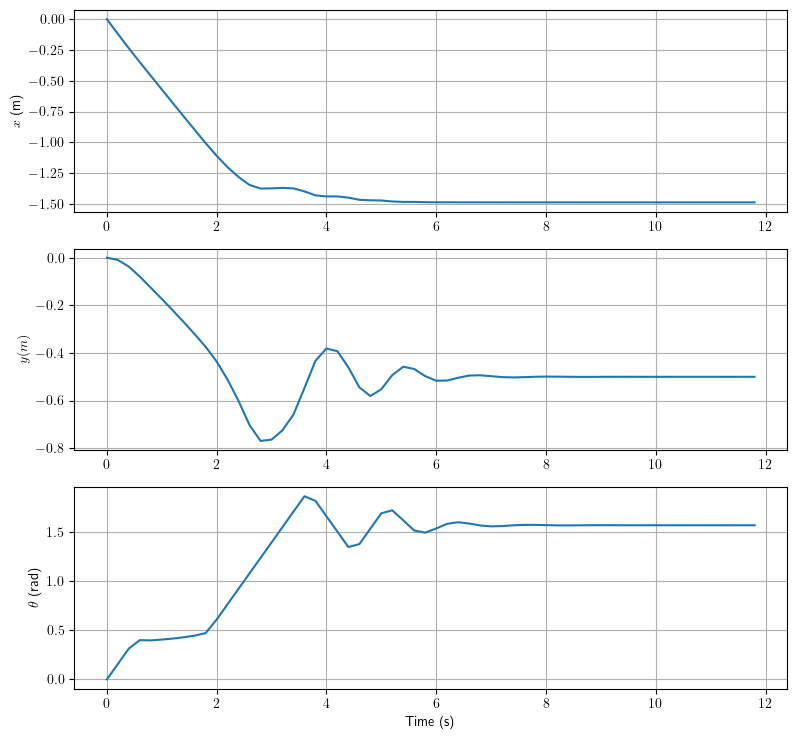

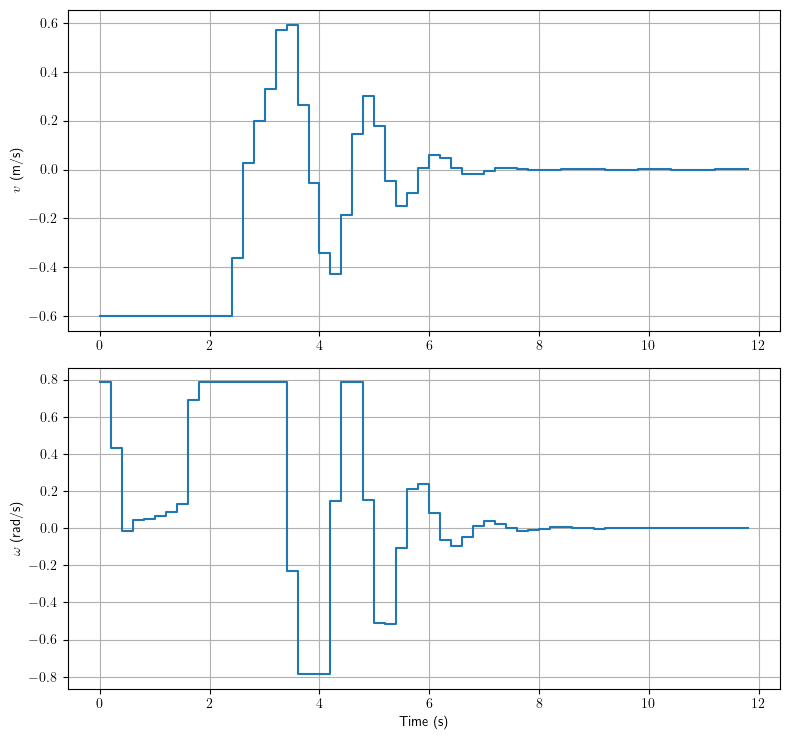

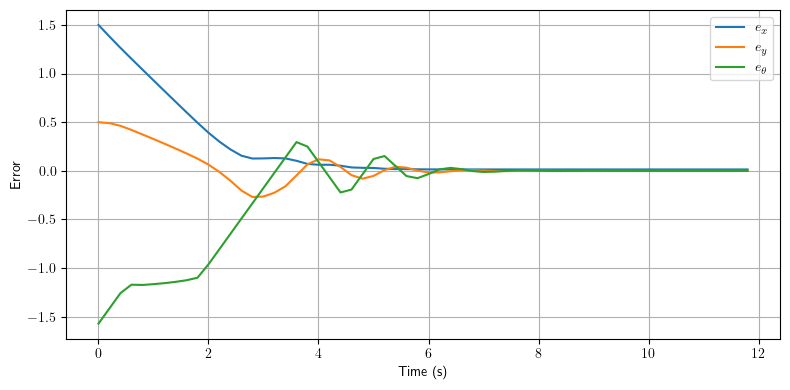

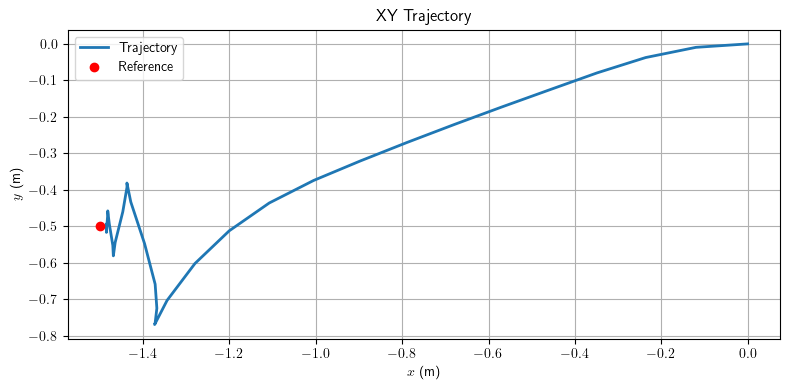

In [51]:
sim.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False
)


Gif save to simulation_p1b_1.gif


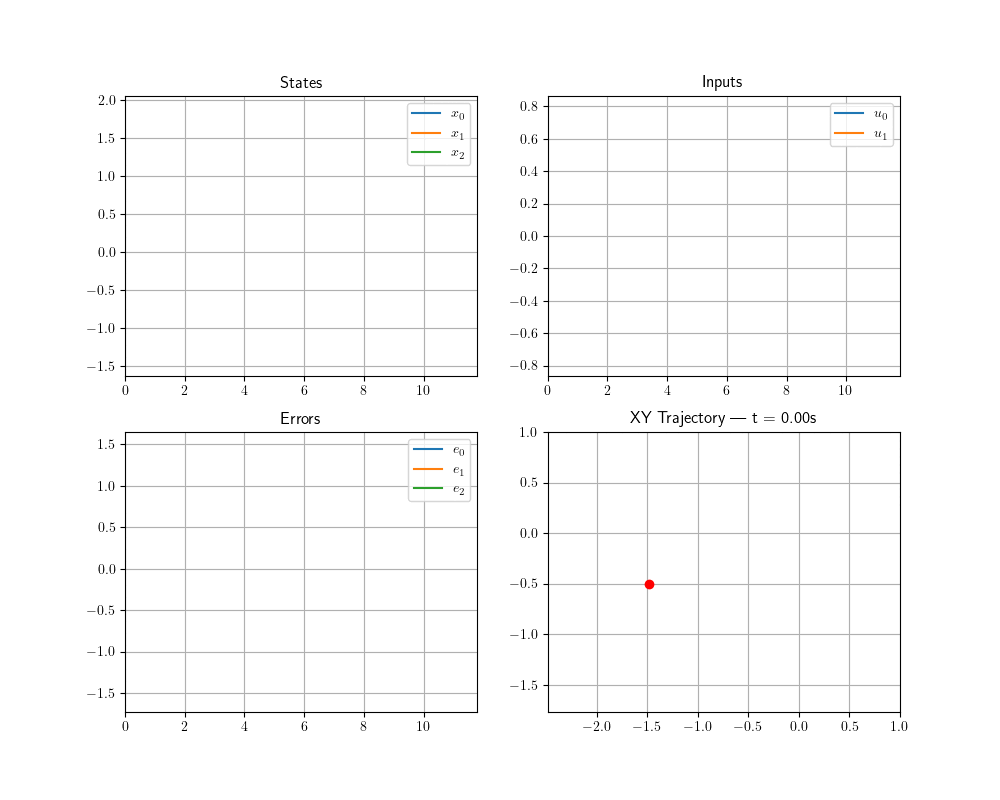

In [52]:
sim.animate_results(filename="simulation_p1b_1.gif",fps=20)

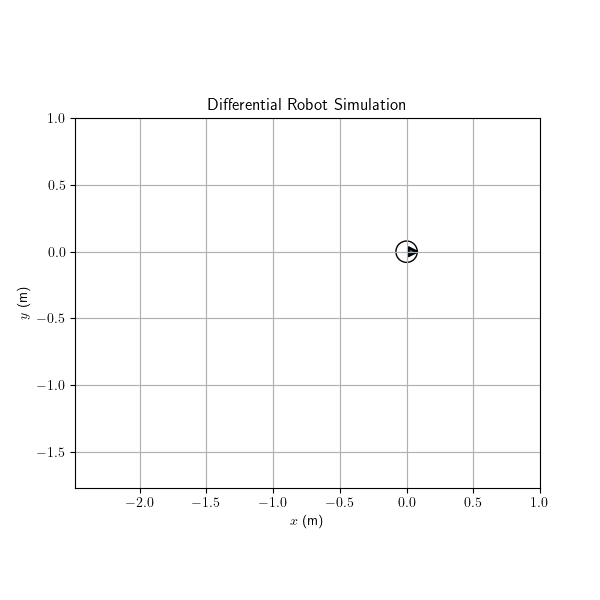

In [53]:
animate_robot(sim.x_history, controller,filename="robot_1b_1.gif")
display(Image(filename="robot_1b_1.gif"))

#### Punto 2b - Caso 2

In [54]:
controller = mpc.MPC_Controller(model_uni)

# Horizon and sampling
N = 25
controller.set_params(N=N, dt=dt)

# Weight matrices
Q = np.diag([200, 200, 50])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort
P = np.diag([8000, 8000, 800]) # Terminal cost


controller.set_obj_function_params(Q, R, P)

# Input constraints
controller.set_input_bounds(
    lb=np.array([-0.6, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# State bounds
controller.set_state_bounds(
    lb=np.array([-2,-2,-10]),
    ub=np.array([2,2,10])
)

controller.set_reference_mode("constant")

controller.setup_controller()

print("MPC successfully built.")

x_ref = np.array([-1.0, -0.5,0])

sim = mpc.MPC_Simulator(model_uni)

x0 = np.array([1.0, 0.5, 0])

x_hist, u_hist, t_hist = sim.run_closed_loop(
    controller=controller,
    x_0=x0,
    X_ref=x_ref,
    n_steps=60
)

print("Simulation complete.")


MPC successfully built.
Simulation complete.


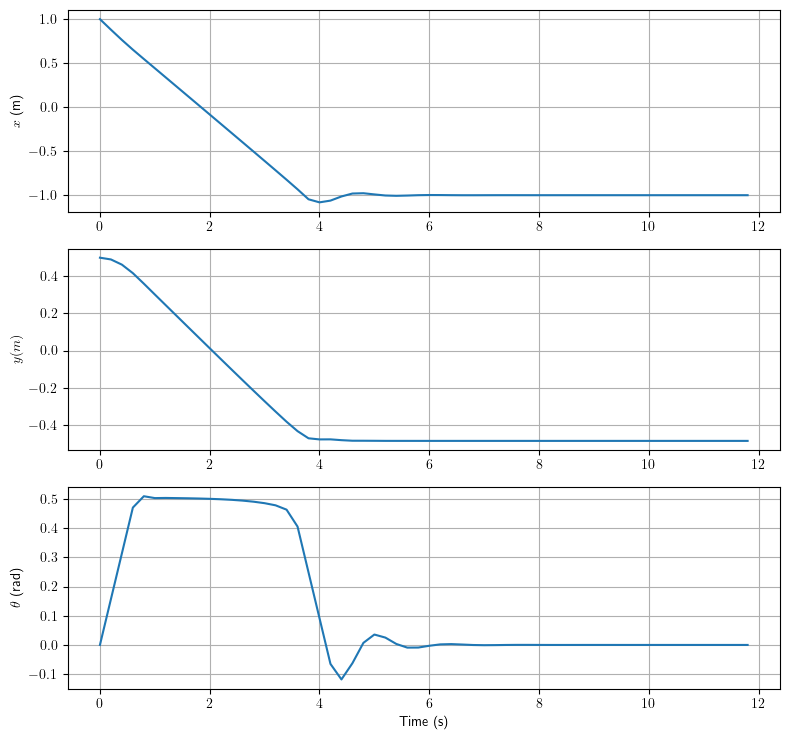

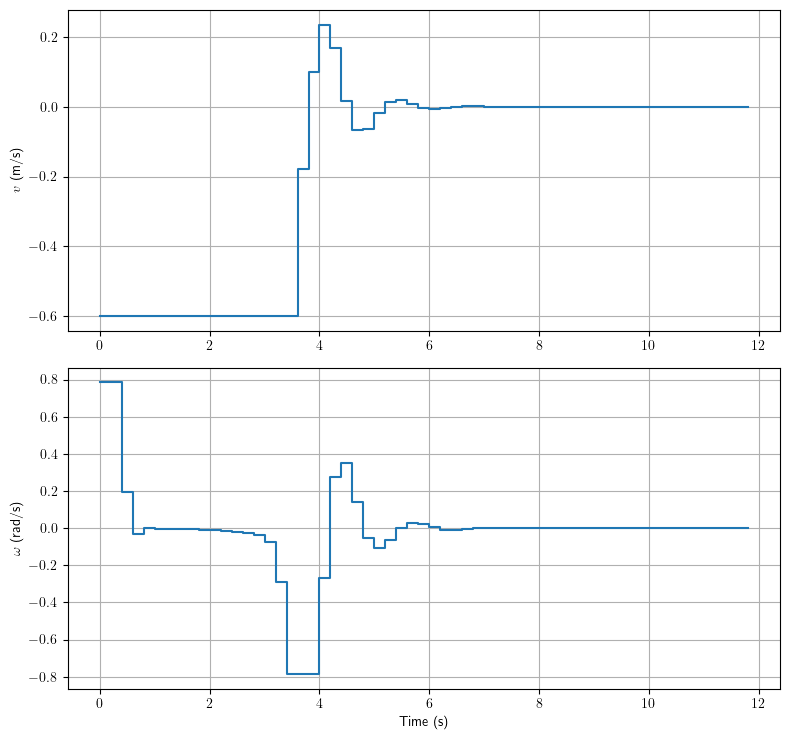

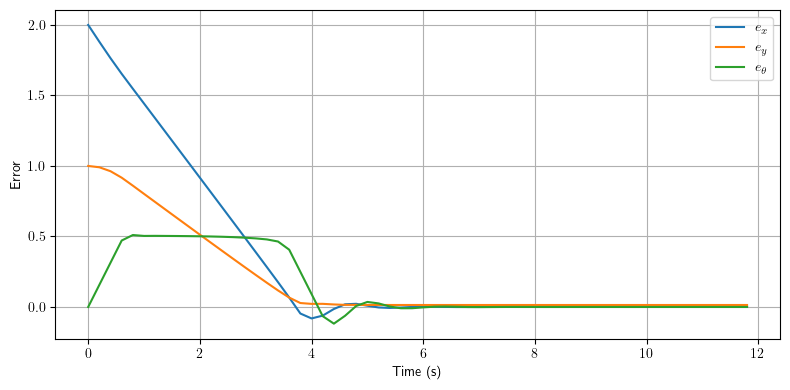

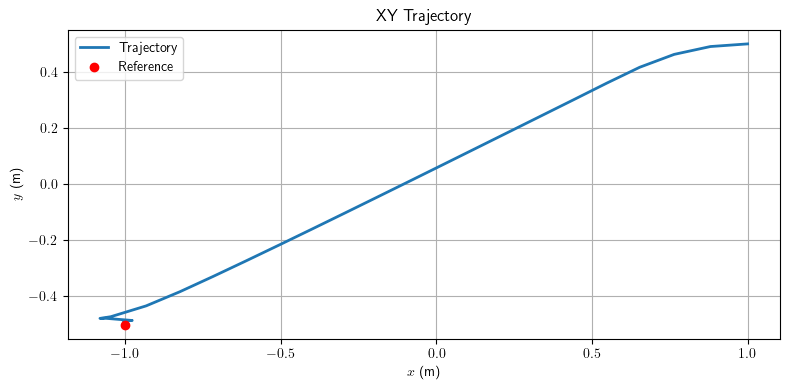

In [ ]:
sim.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False
)


Gif save to simulation_p1b_2.gif


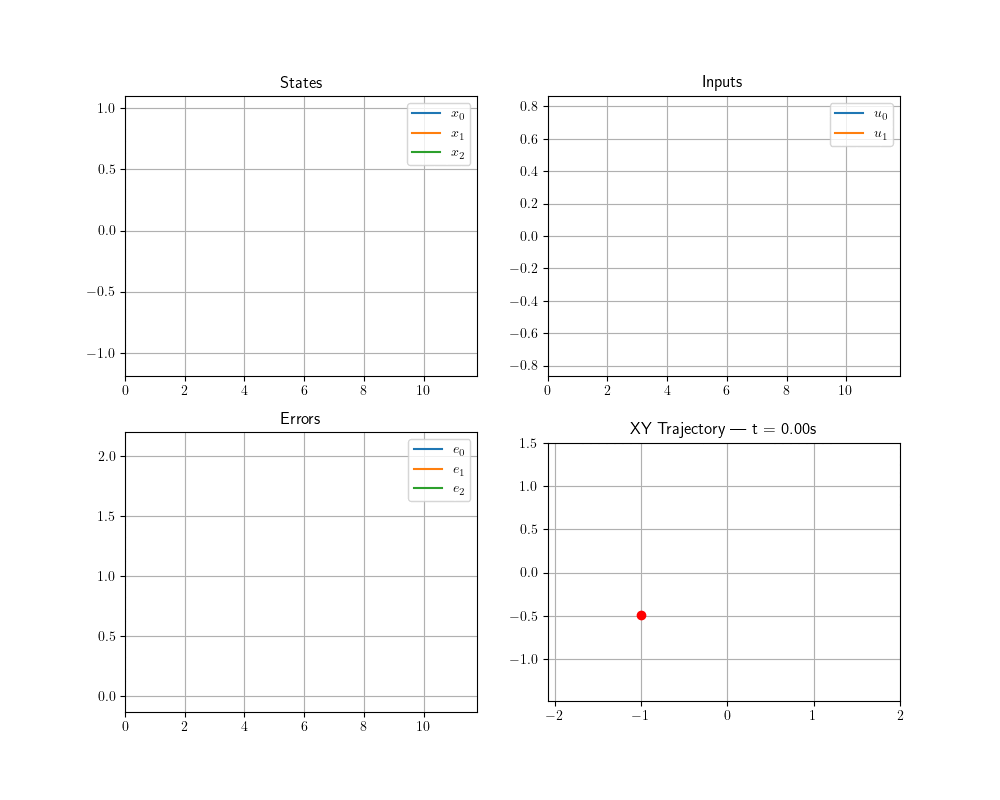

In [56]:
sim.animate_results(filename="simulation_p1b_2.gif",fps=20)

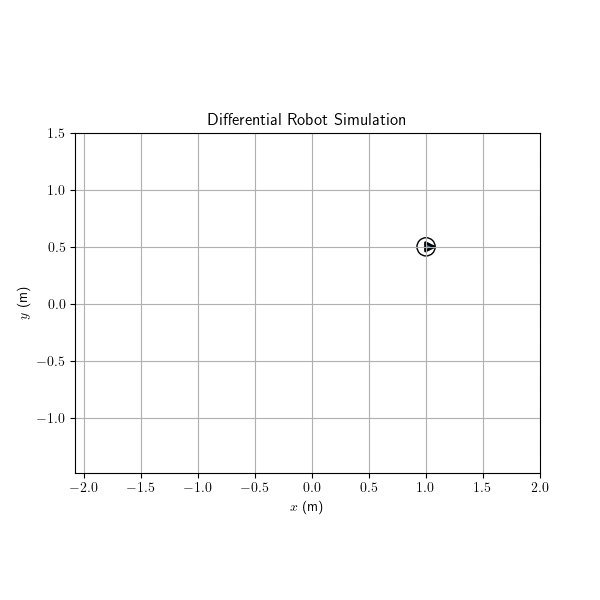

In [57]:
animate_robot(sim.x_history, controller,filename="robot_1b_2.gif")
display(Image(filename="robot_1b_2.gif"))

#### Punto 2c

In [58]:
class CircularObstacle(mpc.Constraint):

    def __init__(self, center, radius, state_indices=(0,1)):
        self.center = center
        self.radius = radius
        self.state_indices = state_indices

    def casadi_expression(self, x, u):
        """
        r^2 - (x-xc)^2 - (y-yc)^2 <= 0
        """
        x_idx, y_idx = self.state_indices
        xc, yc = self.center
        r = self.radius

        return r**2 - (x[x_idx] - xc)**2 - (x[y_idx] - yc)**2

    def plot(self, ax):
        """
        Draw obstacle region.
        """
        circle = plt.Circle(
            self.center,
            self.radius,
            color="red",
            alpha=0.3
        )
        ax.add_patch(circle)

In [63]:
controller = mpc.MPC_Controller(model_uni)

# Horizon and sampling
N = 35
controller.set_params(N=N, dt=dt)

# Weight matrices
Q = np.diag([200, 200, 50])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort
P = np.diag([8000, 8000, 800]) # Terminal cost


controller.set_obj_function_params(Q, R, P)

# Input constraints
controller.set_input_bounds(
    lb=np.array([-0.6, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# State bounds
controller.set_state_bounds(
    lb=np.array([-2,-2,-10]),
    ub=np.array([2,2,10])
)

circle_obs = CircularObstacle(center=(0.5, 0.3), radius=0.1)

controller.add_constraint(circle_obs)

controller.set_reference_mode("constant")

controller.setup_controller()

print("MPC successfully built.")

x_ref = np.array([1.5, 1.5,0])

sim = mpc.MPC_Simulator(model_uni)

x0 = np.array([0, 0, 0])

x_hist, u_hist, t_hist = sim.run_closed_loop(
    controller=controller,
    x_0=x0,
    X_ref=x_ref,
    n_steps=90
)

print("Simulation complete.")


MPC successfully built.
Simulation complete.


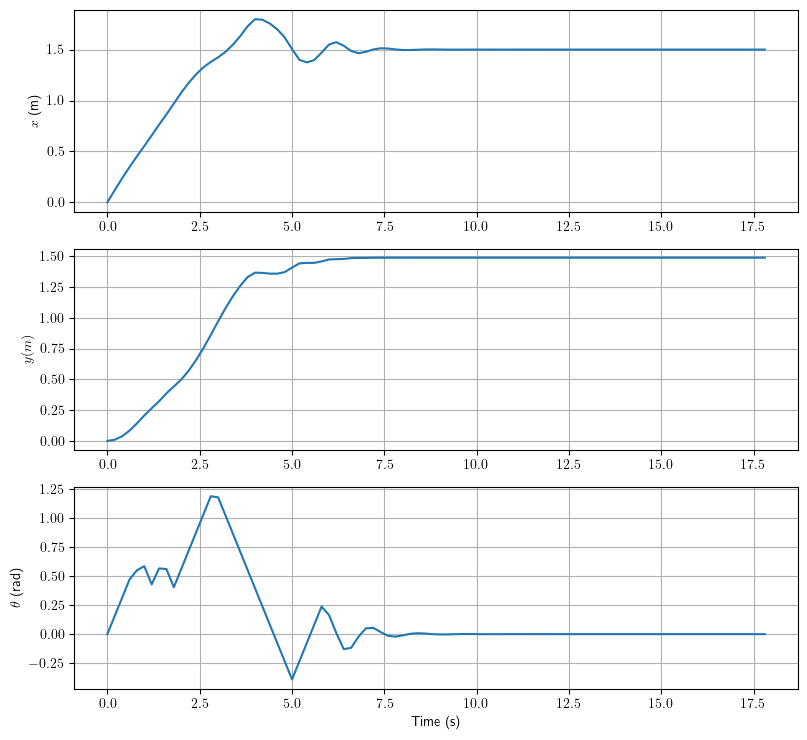

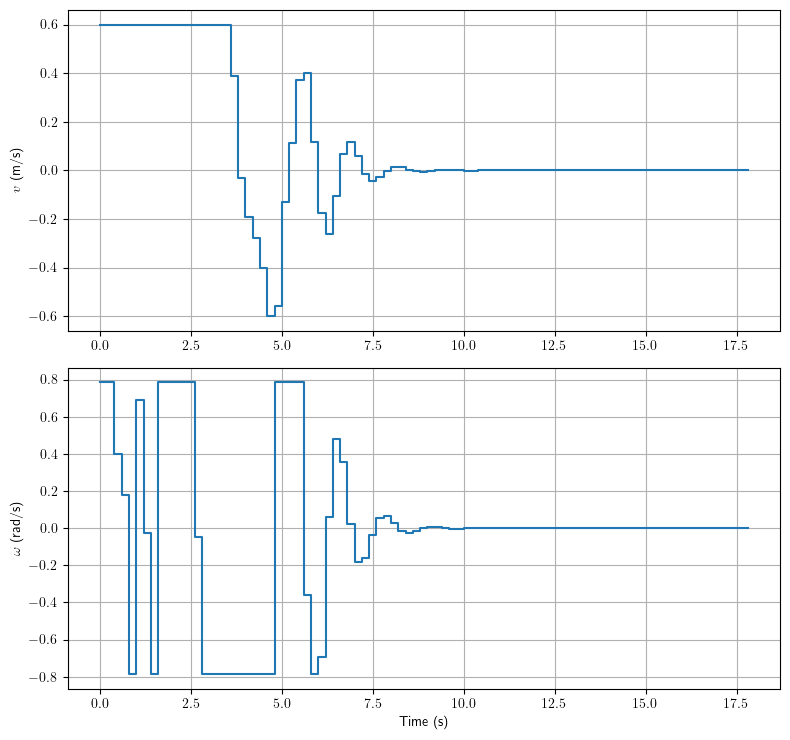

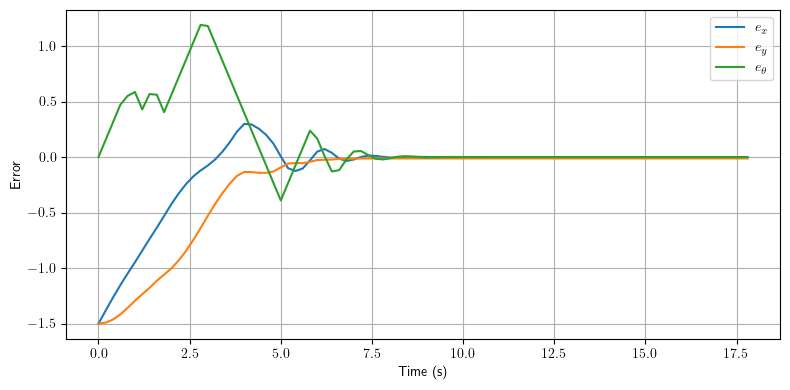

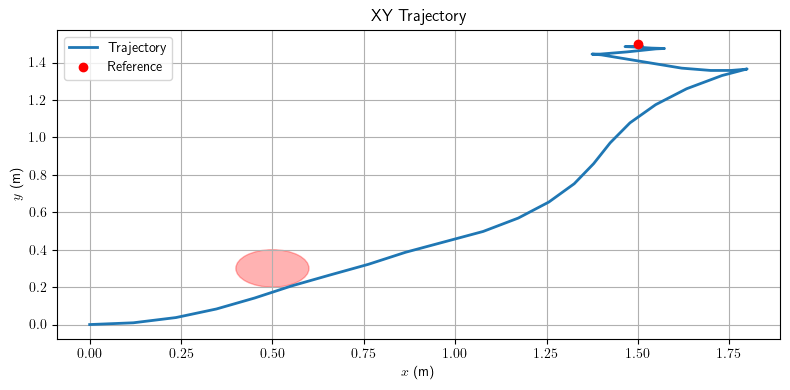

In [64]:
sim.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False
)


Gif save to simulation_p1c_1.gif


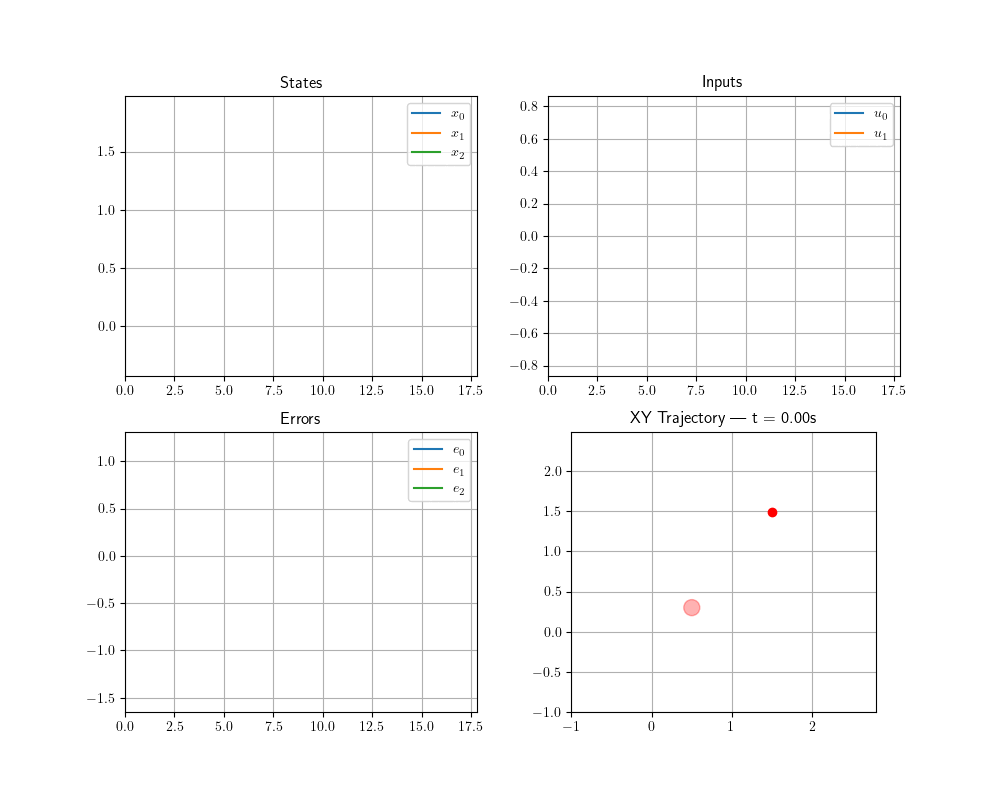

In [65]:
sim.animate_results(filename="simulation_p1c_1.gif",fps=20)

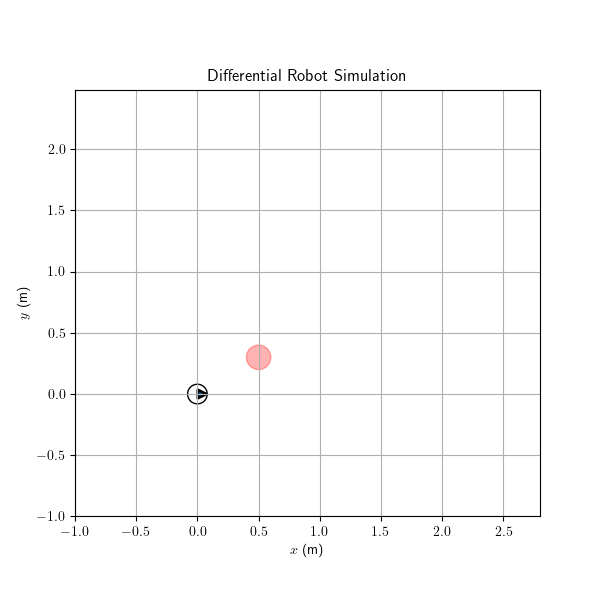

In [66]:
animate_robot(sim.x_history, controller,filename="robot_1c_1.gif")
display(Image(filename="robot_1c_1.gif"))

#### Punto 2d - Caso 1

In [67]:
mpc_tracking = mpc.MPC_Controller(model_uni)

Q = np.diag([200, 200, 200])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort
P = np.diag([8000, 8000, 800])     # Terminal cost

mpc_tracking.set_params(N=40, dt=0.2)

mpc_tracking.set_obj_function_params(Q, R,P)

# Input constraints
mpc_tracking.set_input_bounds(
    lb=np.array([0, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# state bounds
mpc_tracking.set_state_bounds(
    lb=np.array([-3,-3,-10]),
    ub=np.array([3,3,10])
)

mpc_tracking.set_reference_mode("trajectory tracking")

mpc_tracking.setup_controller()

def square_reference(t0, N, dt):

    nx = 3
    ref = np.zeros((nx, N+1))

    L = 2.0        # side length
    v = 0.6        # constant linear speed
    T = 4 * L / v  # total period

    for k in range(N+1):

        t = t0 + k*dt
        s = (v * t) % (4 * L)   # position along perimeter

        # --- Side 1: move right ---
        if s < L:
            x = s
            y = 0
            theta = 0

        # --- Side 2: move up ---
        elif s < 2*L:
            x = L
            y = s - L
            theta = np.pi/2

        # --- Side 3: move left ---
        elif s < 3*L:
            x = L - (s - 2*L)
            y = L
            theta = np.pi

        # --- Side 4: move down ---
        else:
            x = 0
            y = L - (s - 3*L)
            theta = 3*np.pi/2

        ref[:,k] = [x, y, theta]

    # # Important for MPC continuity
    ref[2,:] = np.unwrap(ref[2,:])

    return ref


x0 = np.array([0, 0.0, 0.0])

sim_tracking = mpc.MPC_Simulator(model_uni)

sim_tracking.run_closed_loop(
    controller=mpc_tracking,
    x_0=x0,
    n_steps=90,
    reference_function=square_reference
)



(array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.19995771e-01, -8.71156897e-04, -1.45195382e-02],
        [ 2.39982272e-01, -2.66987932e-03, -1.54602958e-02],
        [ 3.59967488e-01, -4.55318994e-03, -1.59295044e-02],
        [ 4.79951626e-01, -6.50393273e-03, -1.65843091e-02],
        [ 5.99934217e-01, -8.54695656e-03, -1.74677379e-02],
        [ 7.19914692e-01, -1.07105496e-02, -1.85941062e-02],
        [ 8.39892352e-01, -1.30248060e-02, -1.99792319e-02],
        [ 9.59866351e-01, -1.55219008e-02, -2.16420244e-02],
        [ 1.07983563e+00, -1.82359109e-02, -2.35953437e-02],
        [ 1.19979922e+00, -2.11908777e-02, -2.56590911e-02],
        [ 1.31976293e+00, -2.41406270e-02, -2.35083647e-02],
        [ 1.43969542e+00, -2.15818513e-02,  6.61721575e-02],
        [ 1.55831909e+00, -4.29474606e-03,  2.23251773e-01],
        [ 1.67277797e+00,  3.13363467e-02,  3.80331403e-01],
        [ 1.76975141e+00,  7.92454634e-02,  5.37411036e-01],
        [ 1.83464272e+00

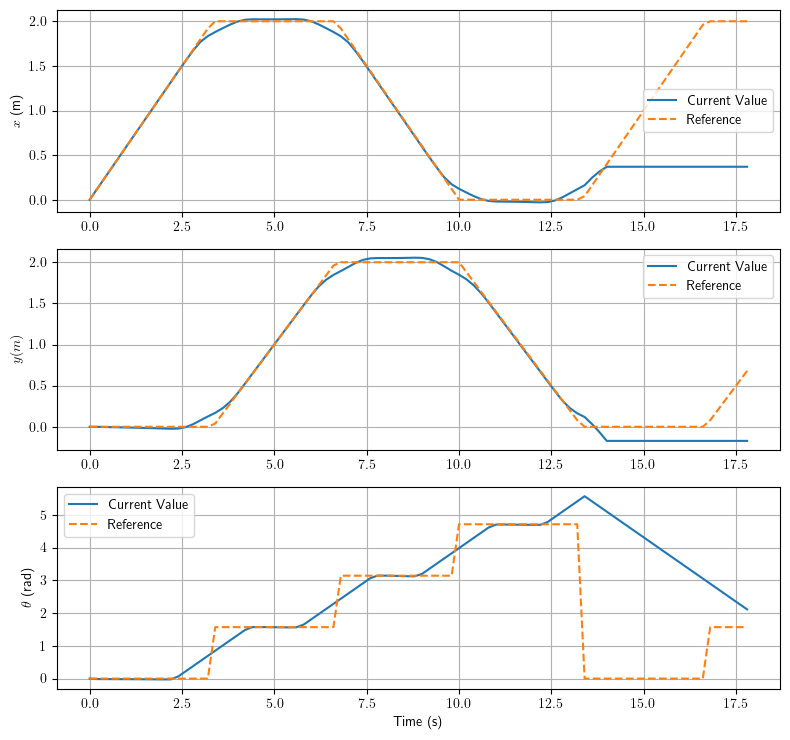

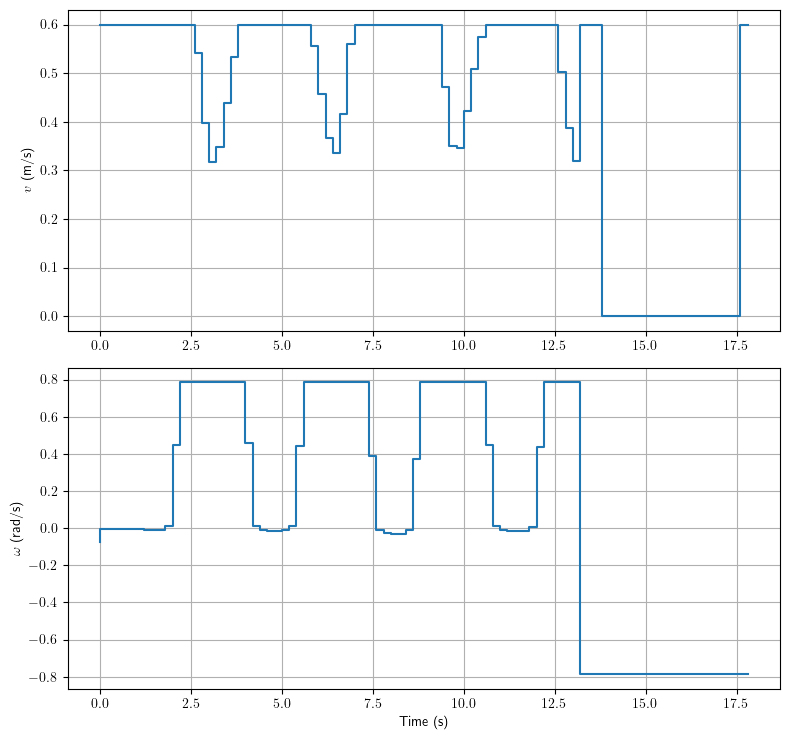

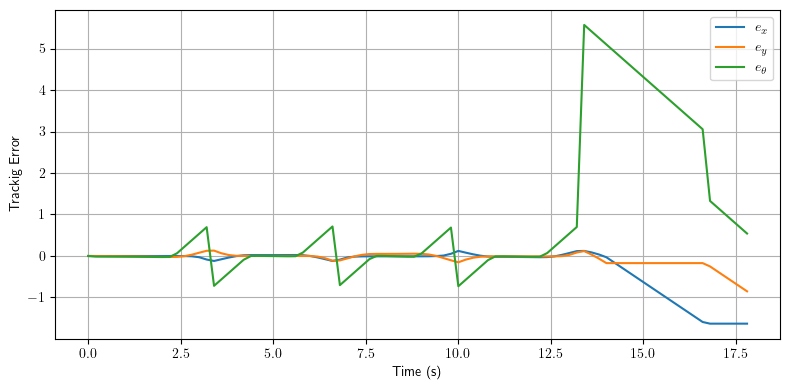

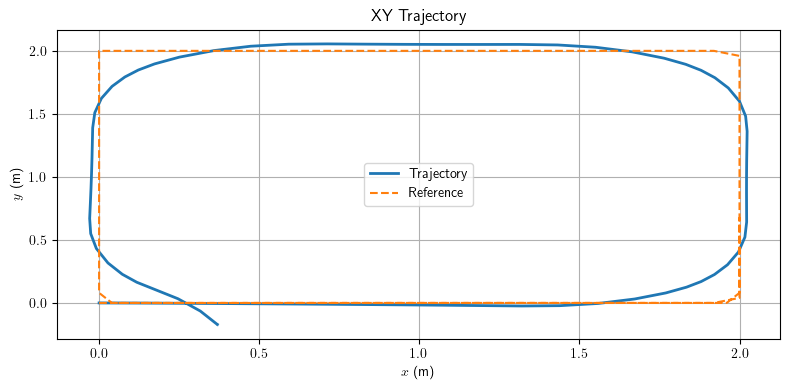

In [68]:
sim_tracking.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False,
)

Gif save to tracking_simulation_1.gif


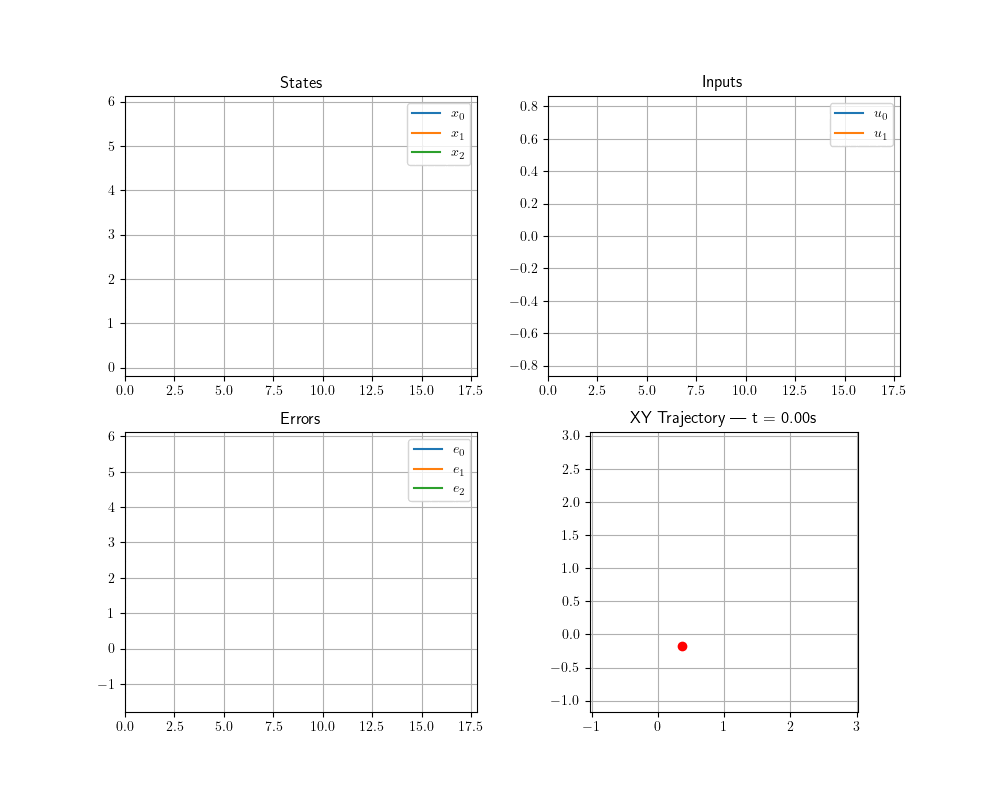

In [69]:
sim_tracking.animate_results("tracking_simulation_1.gif",20)

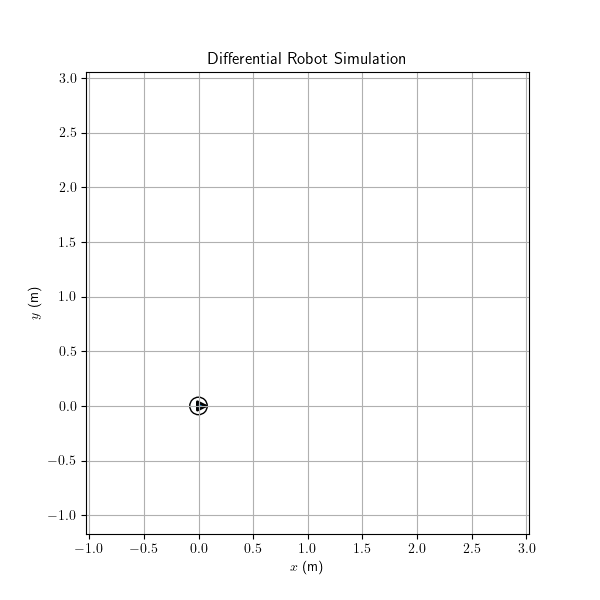

In [70]:
animate_robot(sim_tracking.x_history, mpc_tracking,filename="tracking_robot_motion_1.gif")
display(Image(filename="tracking_robot_motion_1.gif"))

#### Punto 2d - Caso 2

In [3]:
mpc_tracking = mpc.MPC_Controller(model_uni)

Q = np.diag([200, 200, 200])     # Penalize position strongly
R = np.diag([10, 0.5])      # Penalize control effort
P = np.diag([8000, 8000, 800])     # Terminal cost

mpc_tracking.set_params(N=40, dt=0.2)

mpc_tracking.set_obj_function_params(Q, R,P)

# Input constraints
mpc_tracking.set_input_bounds(
    lb=np.array([0, -np.pi/4]),   
    ub=np.array([0.6, np.pi/4])     
)

# state bounds
mpc_tracking.set_state_bounds(
    lb=np.array([-3,-3,-10]),
    ub=np.array([3,3,10])
)

mpc_tracking.set_reference_mode("trajectory tracking")

mpc_tracking.setup_controller()

def square_reference(t0, N, dt):

    nx = 3
    ref = np.zeros((nx, N+1))

    L = 2.0        # side length
    v = 0.1        # constant linear speed
    T = 4 * L / v  # total period

    for k in range(N+1):

        t = t0 + k*dt
        s = (v * t) % (4 * L)   # position along perimeter

        # --- Side 1: move right ---
        if s < L:
            x = s
            y = 0
            theta = 0

        # --- Side 2: move up ---
        elif s < 2*L:
            x = L
            y = s - L
            theta = np.pi/2

        # --- Side 3: move left ---
        elif s < 3*L:
            x = L - (s - 2*L)
            y = L
            theta = np.pi

        # --- Side 4: move down ---
        else:
            x = 0
            y = L - (s - 3*L)
            theta = 3*np.pi/2

        ref[:,k] = [x, y, theta]

    # # Important for MPC continuity
    ref[2,:] = np.unwrap(ref[2,:])

    return ref


x0 = np.array([0, 0.0, 0.0])

sim_tracking = mpc.MPC_Simulator(model_uni)

sim_tracking.run_closed_loop(
    controller=mpc_tracking,
    x_0=x0,
    n_steps=400,
    reference_function=square_reference
)




******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************



(array([[0.        , 0.        , 0.        ],
        [0.02      , 0.        , 0.        ],
        [0.04      , 0.        , 0.        ],
        ...,
        [0.00905085, 0.05100565, 5.10413062],
        [0.01608231, 0.03717289, 5.26121025],
        [0.02319656, 0.02736122, 5.41828989]]),
 array([[ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 9.99999999e-02,  0.00000000e+00],
        [ 9.99999999e-02,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
        [ 1.00000000e-01,  0.00000000e+00],
     

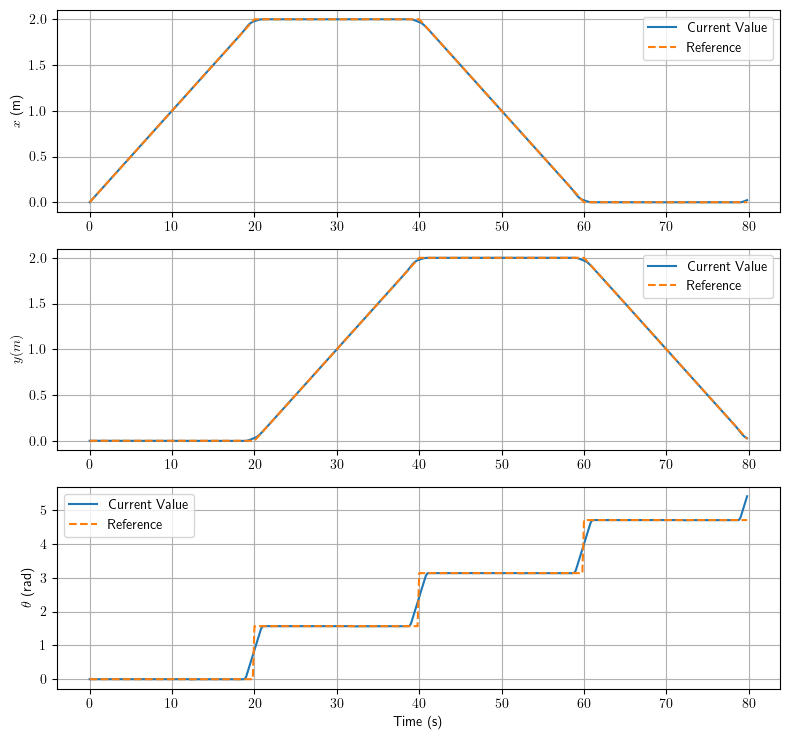

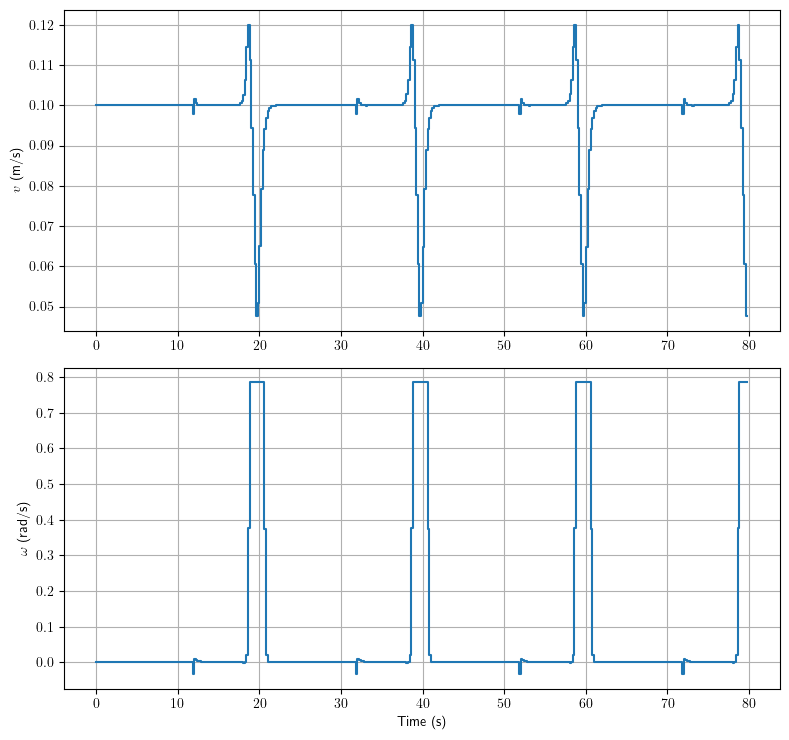

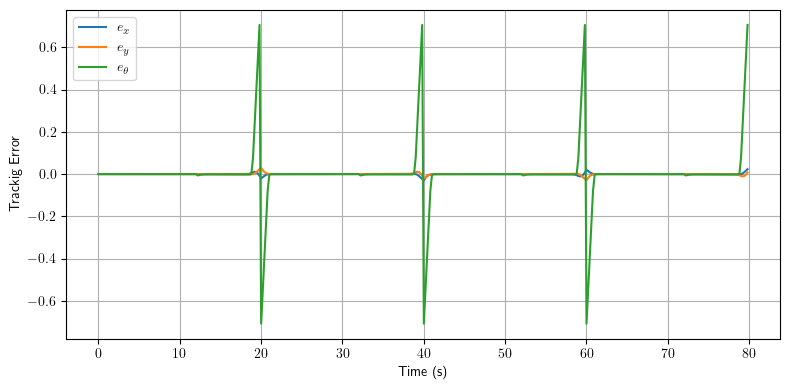

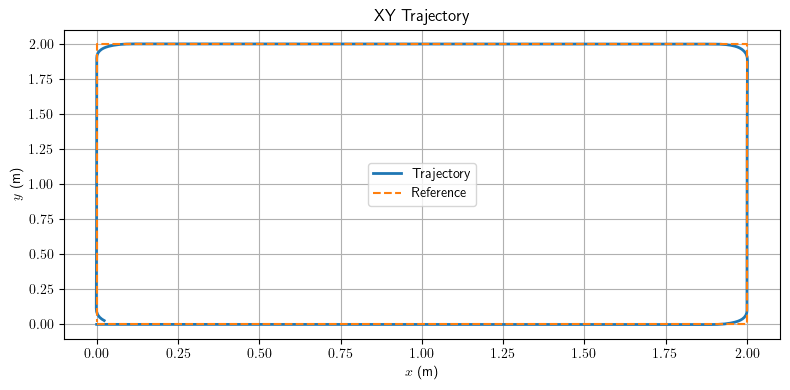

In [4]:
sim_tracking.plot_results(
    state_labels=[r"$x$ (m)", r"$y (m)$", r"$\theta$ (rad)"],
    input_labels=[r"$v$ (m/s)", r"$\omega$ (rad/s)"],
    error_labels=[r"$e_{x}$", r"$e_{y}$", r"$e_{\theta}$"],
    save=False,
)

In [ ]:
sim_tracking.animate_results("tracking_simulation_2.gif",15)

In [ ]:
animate_robot(sim_tracking.x_history, mpc_tracking,filename="tracking_robot_motion_2.gif")
display(Image(filename="tracking_robot_motion_2.gif"))